# III ) <u> Détection et représentation graphique d’éventuelles valeurs aberrantes de la variable prix</u>

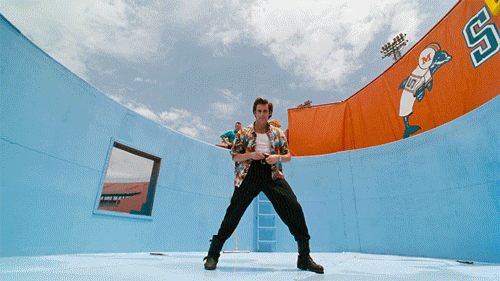

Pour cette partie nous pouvons utiliser deux méthodes : **le Z-SCORE et l'écart interquartile**. Dans un soucis de synthèse nous nous interesserons uniquement à **l'ecart interquartile**, mais pas avant d'avoir défini ce qu'est un Z-SCORE . 
**Le Z-score est un moyen de déceler les valeurs abérrantes**. Il se contruit de la façon suivante :

***(variable - moyenne de cette variable) / ecart-type de cette variable***

Il faudra ensuite determiner des **limites basses et hautes** (généralement 3 et -3 ) au delà desquelles les valeurs sont présumées abérrantes. 
Dans notre cas d'espèce nous aurions créer une colonne "z-score" équivalente au résultat de l'opération mentionné ci dessus, et ce, pour chaque ligne de prix.

Il aurait suffit ensuite de **trier ces lignes en fonction du seuil déterminé**.


## A) <u>Détection  des outliers avec la méthode de l'écart interquartile</u>

Avant de s'attaquer à la méthode de l'écart interquartile il faut se soumettre à un travail de définition des quartiles .

Les quartiles sont trois valeurs qui séparent un ensemble de données placées en ordre croissant en quatre sous-ensembles comprenant exactement le même nombre de données.

Le premier quartile, noté 
Q1, sépare le premier quart des données du reste des données. 

Le deuxième quartile, noté 
Q2, sépare la distribution en deux parties égales. En d'autres mots, il s'agit de la médiane.

Le troisième quartile, noté 
Q3, sépare les trois premiers quarts des données du reste des données.

En d'autres mots, on peut associer un pourcentage à chacun des quartiles. Pour le premier, 25% des données lui sont inférieures. Pour le second, 50% des données lui sont inférieures. Finalement, 75% des données sont inférieures au troisième quartile.

Pour les mettre en valeur nous disposon de deux méthodes : .describe() et .quartile()

In [43]:
erp_liaison_web.price.describe()

count    825.000000
mean      32.415636
std       26.795849
min        5.200000
25%       14.600000
50%       24.400000
75%       42.000000
max      225.000000
Name: price, dtype: float64

Les quartiles sont mis en valeurs aux lignes 25% 50 % et 75%  représentant respectivemment le Q1 Q2 et Q3. 

In [44]:
Q1 = erp_liaison_web.price.quantile(0.25)
Q3 = erp_liaison_web.price.quantile(0.75)
Q1,Q3

(14.6, 42.0)

Ci dessus un exemple de l'utilisation de la méthode .quartile(). L'écart intéquartile est la différence entre Q3 et Q1.

In [45]:
IQR = Q3-Q1
IQR

27.4

Les valeurs abérantes se situent sous une limites basse contruite par différence entre le Q1 - 1,5 fois l'écart interquartile de façon à ce que chaque valeur inférieure à ce résultat se voit qualifier d'abérantes.
La limites hautes, elle est construite par l'addition du Q3 au produit de l'écart intercartile par 1,5.

In [53]:
limite_basse = round(Q1 - 1.5 * IQR,2)
limite_haute = round(Q3 + 1.5 * IQR,2)

limite_basse,limite_haute

(-26.5, 83.1)

Les limites hautes et basses sont respectivement de **-26,5 et 83,1**, même si nous savons qu'un prix ne peut être negatif, à moins que le vin soit si mauvais que l'on paye les clients pour s'en débaraser.

In [47]:
valeur_aberrantes= erp_liaison_web[(erp_liaison_web.price<limite_basse)| (erp_liaison_web.price> limite_haute)]

In [48]:
valeur_aberrantes

,product_id,onsale_web,price,stock_quantity,stock_status,sku,virtual,downloadable,rating_count,average_rating,...,post_modified_gmt,post_content_filtered,post_parent,guid,menu_order,post_type,post_mime_type,comment_count,_merge,ca par produit
19,4055,0,86.1,0,outofstock,NaN,NaN,NaN,NaN,NaN,...,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only,NaN
30,4594,1,144.0,0,outofstock,NaN,NaN,NaN,NaN,NaN,...,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only,NaN
47,5070,1,84.7,0,outofstock,NaN,NaN,NaN,NaN,NaN,...,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only,NaN
55,6324,0,92.0,18,instock,NaN,NaN,NaN,NaN,NaN,...,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only,NaN
154,4115,1,100.0,11,instock,15382,0.0,0.0,0.0,0.0,...,2020-02-08 10:45:02,NaN,0.0,https://www.bottle-neck.fr/?post_type=product&...,0.0,product,NaN,0.0,both,0.0
156,4132,1,88.4,5,instock,11668,0.0,0.0,0.0,0.0,...,2020-02-20 08:55:02,NaN,0.0,https://www.bottle-neck.fr/?post_type=product&...,0.0,product,NaN,0.0,both,0.0
291,4352,1,225.0,0,outofstock,15940,0.0,0.0,0.0,0.0,...,2020-03-07 10:18:45,NaN,0.0,https://www.bottle-neck.fr/?post_type=product&...,0.0,product,NaN,0.0,both,1125.0
293,4355,1,126.5,2,instock,12589,0.0,0.0,0.0,0.0,...,2020-08-13 08:15:02,NaN,0.0,https://www.bottle-neck.fr/?post_type=product&...,0.0,product,NaN,0.0,both,1391.5
297,4359,1,85.6,0,outofstock,13853,0.0,0.0,0.0,0.0,...,2019-12-23 08:30:11,NaN,0.0,https://www.bottle-neck.fr/?post_type=product&...,0.0,product,NaN,0.0,both,85.6
310,4402,1,176.0,8,instock,3510,0.0,0.0,0.0,0.0,...,2020-08-22 09:35:03,NaN,0.0,https://www.bottle-neck.fr/?post_type=product&...,0.0,product,NaN,0.0,both,2288.0


## B) <u>Représentation graphique des outliers.</u>

In [49]:
px.box( erp_liaison_web['price']
       , x ="price", orientation ="h"
       ,title="Réparttion des prix unitaires et visualisation des Outilers potentiels & Outliers "
      
        )


La valeur centrale du graphique est la médiane qui est de 24,4 (il existe autant de boutielles d'une valeur supérieures qu'inférieures à cette valeur dans l'échantillon).

Les bords du rectangle sont les quartiles (Pour le bord le plus à gauche, un quart des observations ont des valeurs plus petites et trois quart ont des valeurs plus grandes, le bord le plus à droite suit le même raisonnement).

Les extrémités des moustaches sont calculées en utilisant 1.5 fois l'espace interquartile (la distance entre le 1er et le 3ème quartile). Ce qui a été calculé. 

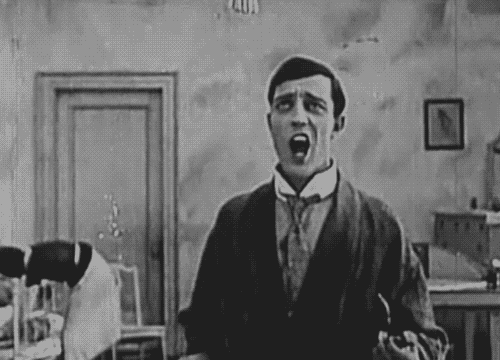